In [1]:
import os 
import datetime
from datetime import timedelta 

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize']=(8,6)
mpl.rcParams['axes.grid']=False
%config InlineBackend.figure_format = 'retina'

# Exploratory Data Analysis (EDA)
- Loading the dataset
- Data wrangling for missing variables.
- Data transformation.
- Data visualization

## Loading Dataset

In [2]:
df = pd.read_excel('Data_B2_Aug22.xlsx',sheet_name='Data GT22',index_col='Time',parse_dates=True)
df.head(5)

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,...,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
Time,,,,,,,,,,,,,,,,,,,,,
2022-08-01 09:49:00,78.699997,27.240005,3.4168,14.077165,0.9351,22.874973,51.300552,3002.625000,5.782977,5.560313,...,2488.584717,17.878477,240.980576,196.373199,9.736469,540.816895,106.997826,95.375,27.982990,85.828552
2022-08-01 09:50:00,78.739998,28.399994,3.4168,14.105806,0.9374,22.874996,51.344681,2998.125000,5.464071,5.602250,...,2478.031738,18.039955,240.604218,194.496582,9.690649,540.990479,106.944092,94.750,27.979242,85.829109
2022-08-01 09:51:00,78.760002,29.160004,3.4256,14.135489,0.9327,22.879995,51.321377,2998.875000,6.025958,6.257484,...,2489.635010,18.127897,239.444595,197.838074,9.774592,540.972900,106.804222,94.750,27.989552,85.829208
2022-08-01 09:52:00,79.260002,29.000000,3.4432,14.102937,0.9314,22.884874,51.260517,3000.375000,6.603911,6.621680,...,2487.260986,18.050598,240.251846,196.369446,9.647359,540.576599,106.660316,94.625,27.972036,85.830902
2022-08-01 09:53:00,78.059998,28.679993,3.3984,14.108955,0.9280,22.890154,51.318005,2999.250244,5.859330,6.663615,...,2467.916260,18.332258,239.732803,198.700562,10.038991,540.100098,106.708961,95.375,27.984232,85.828285


## Checking Missing Value  & Data Distributions

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39182 entries, 2022-08-01 09:49:00 to 2022-08-31 23:59:00
Data columns (total 46 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   GT22_GEN_WATT            39182 non-null  float64
 1   GT22_GEN_VAR             39182 non-null  float64
 2   GT22_GEN_CURRENT         39182 non-null  float64
 3   GT22_GEN_VOLTAGE         39182 non-null  float64
 4   GT22_PWR_FACTOR          39182 non-null  float64
 5   GT22_FUEL_GAS_PRESS      39182 non-null  float64
 6   GT22_CSO                 39182 non-null  float64
 7   GT22_SPEED               39182 non-null  float64
 8   GT22_IGV_CSO             39182 non-null  float64
 9   GT22_IGV_FB              39182 non-null  float64
 10  GT22_EXH_DAMPER_CMD      39182 non-null  int64  
 11  GT22_EXH_DAMPER_FB       39182 non-null  float64
 12  GT22_COMP_IN_AIR_TEMP    39182 non-null  float64
 13  GT22_RCA_TEMP_R          39182 non-null  

In [4]:
pd.set_option('display.max_columns', None) #to preview all columns
df.describe()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
count,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.0,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.0,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000
mean,79.101369,14.737455,3.316233,13.871276,0.910777,22.970156,51.118813,2999.903854,7.295493,7.346361,100.0,103.831258,26.458441,193.566929,193.194795,334.267149,362.765185,364.412285,383.630369,334.235815,363.280117,559.518117,543.121705,28.067770,30.774064,3.828232,0.0,371.286286,9.525571,43.269772,43.456268,445.982681,1015.732762,99.272395,15.145707,324.916457,2476.633927,18.982560,239.771298,199.785565,9.690105,538.356663,107.088461,94.705357,28.552201,82.449083
std,5.287101,8.033899,0.230499,0.130090,0.350970,0.335228,0.983637,1.942000,9.469280,9.426353,0.0,0.054307,2.564386,6.095285,6.030809,4.567581,5.127812,5.829717,5.909149,6.490833,7.276168,10.321454,8.417925,1.236885,1.599241,0.993232,0.0,6.441968,0.393329,1.880067,1.799196,6.393336,86.847983,2.858994,0.131912,134.046012,217.400336,1.330519,2.385555,14.473824,1.060962,7.670067,0.921800,3.427696,2.531611,9.512342
min,53.419998,-12.080002,2.200800,13.402571,-0.999901,22.039639,45.447968,2993.250000,0.000000,-0.802820,100.0,103.562500,21.773439,178.785400,178.297714,310.261963,335.434937,321.209808,341.264038,294.560852,317.706055,476.670074,481.783264,22.073278,25.775126,1.501124,0.0,354.141663,8.541692,39.033924,39.247009,412.499207,847.948669,74.853737,14.746293,133.099792,1449.432617,17.086407,216.892258,179.186981,6.340116,481.367279,105.278595,73.750000,24.331244,47.537361
25%,78.360001,9.080002,3.259200,13.783537,0.962600,22.815644,51.013855,2998.500000,4.182848,4.228717,100.0,103.812500,24.431248,189.900280,189.551670,332.427109,359.574593,363.636963,382.399910,332.699791,361.510986,561.085037,544.804825,27.891312,29.746223,3.269518,0.0,367.217598,9.413499,41.750373,41.993487,442.799927,972.675568,99.171764,15.100085,319.899567,2446.357483,18.314198,239.153732,195.016689,9.247575,539.519104,106.651857,94.500000,26.506631,75.324594
50%,78.680000,15.080002,3.295200,13.875663,0.979900,22.900003,51.111444,3000.000000,5.532350,5.585420,100.0,103.812500,25.890019,192.399086,191.940849,333.685349,361.759735,364.839630,383.625854,335.474777,364.711823,561.522980,544.976074,27.963629,30.372973,3.626584,0.0,369.801270,9.463442,43.176727,43.475489,448.265762,999.825562,99.775448,15.118406,320.403305,2467.032349,18.641658,239.948494,197.035652,9.573142,540.057190,106.890312,94.875000,27.991001,85.724842
75%,79.580002,20.199997,3.343200,13.957841,0.988300,22.979996,51.234881,3001.500000,7.107598,7.168286,100.0,103.875000,28.446060,196.115765,195.826019,336.149040,366.372375,366.299011,385.871704,337.852501,367.084427,561.939774,545.123520,28.186698,31.795345,4.194599,0.0,374.347977,9.530223,44.983936,45.156

## Data Transformation 

In [5]:
#Average RCA and Discavity Temp
df['GT22_RCA_TEMP_AVG'] = (df['GT22_RCA_TEMP_R'] + df['GT22_RCA_TEMP_L']) / 2
df['GT22_DISC_TEMP2_AVG'] = (df['GT22_DISC_TEMP2_R'] + df['GT22_DISC_TEMP2_L']) / 2
df['GT22_DISC_TEMP3_AVG'] = (df['GT22_DISC_TEMP3_R'] + df['GT22_DISC_TEMP3_L']) / 2
df['GT22_DISC_TEMP4_AVG'] = (df['GT22_DISC_TEMP4_R'] + df['GT22_DISC_TEMP4_L']) / 2

### Drop the Unusual periods

In [6]:
#Drop the Unusual periods

#Water Injection Period
df = df.drop(df[df.GT22_WTR_INJ_FLOW > 0.5].index)
df = df.drop(df[df.GT22_STEAM_INJ_FLOW < 2.5].index)

#NOx Outlier Period
df = df.drop(df[df.GT22_NOX_7O2 < 200].index)
df = df.drop(df[df.GT22_NOX_7O2 > 300].index)

In [7]:
df.head()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-08-01 09:49:00,78.699997,27.240005,3.4168,14.077165,0.9351,22.874973,51.300552,3002.625000,5.782977,5.560313,100,103.8125,25.872429,191.403458,191.023621,332.898376,357.327057,360.781769,383.306976,338.176270,363.251099,562.935242,545.330750,28.078625,31.398972,3.729207,0,369.666046,9.452796,43.095043,43.422951,451.499847,1001.545776,100.422119,15.107552,133.099792,2488.584717,17.878477,240.980576,196.373199,9.736469,540.816895,106.997826,95.375,27.982990,85.828552,191.213539,345.112717,372.044373,350.713684
2022-08-01 09:50:00,78.739998,28.399994,3.4168,14.105806,0.9374,22.874996,51.344681,2998.125000,5.464071,5.602250,100,103.8125,26.179941,191.404999,191.276108,332.969269,356.996674,360.848419,383.294922,337.882355,363.131256,562.874084,545.476440,28.020256,31.402889,3.862979,0,369.805389,9.443254,43.120922,43.393005,451.499847,1001.398315,100.302856,15.105381,133.099792,2478.031738,18.039955,240.604218,194.496582,9.690649,540.990479,106.944092,94.750,27.979242,85.829109,191.340553,344.982971,372.071671,350.506805
2022-08-01 09:51:00,78.760002,29.160004,3.4256,14.135489,0.9327,22.879995,51.321377,2998.875000,6.025958,6.257484,100,103.8125,26.380709,191.246078,191.195435,332.914429,357.058044,360.831329,383.289276,337.690216,362.952148,563.208557,545.593140,28.085732,31.402096,3.801221,0,369.688873,9.464601,43.106224,43.452282,451.548889,1003.209839,99.823021,15.105173,133.099792,2489.635010,18.127897,239.444595,197.838074,9.774592,540.972900,106.804222,94.750,27.989552,85.829208,191.220757,344.986237,372.060303,350.321182
2022-08-01 09:52:00,79.260002,29.000000,3.4432,14.102937,0.9314,22.884874,51.260517,3000.375000,6.603911,6.621680,100,103.8125,26.486567,191.414291,191.370911,333.077087,357.193115,360.852509,383.392273,337.554474,362.794464,562.412659,545.586609,28.076559,31.372683,3.812061,0,369.989594,9.473760,43.144012,43.477997,451.599945,1004.891235,100.086159,15.109420,133.099792,2487.260986,18.050598,240.251846,196.369446,9.647359,540.576599,106.660316,94.625,27.972036,85.830902,191.392601,345.135101,372.122391,350.174469
2022-08-01 09:53:00,78.059998,28.679993,3.3984,14.108955,0.9280,22.890154,51.318005,2999.250244,5.859330,6.663615,100,103.8125,26.610220,191.696335,191.575073,333.049408,357.515350,360.793213,383.032349,337.050568,362.124268,561.480164,545.395935,27.972401,31.414152,4.066763,0,370.019775,9.466193,43.182171,43.483269,451.599945,1005.249146,99.691124,15.119787,133.099792,2467.916260,18.332258,239.732803,198.700562,10.038991,540.100098,106.708961,95.375,27.984232,85.828285,191.635704,345.282379,371.912781,349.587418


In [8]:
df.describe()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
count,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.0,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.0,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000,38665.000000
mean,79.275499,14.778485,3.323738,13.871722,0.910185,22.962988,51.157695,2999.901133,7.372339,7.423192,100.0,103.831601,26.460850,193.667251,193.293971,334.419843,362.925656,364.679290,383.895686,334.504652,363.580092,560.016608,543.527447,28.108476,30.778310,3.848777,0.0,371.393400,9.532709,43.278731,43.465413,446.106870,1016.210387,99.407083,15.139398,324.962453,2483.848673,18.991194,239.842020,199.932707,9.699706,538.707953,107.080322,94.855847,28.554125,82.423745,193.480611,348.672750,374.287488,349.042372
std,5.001123,8.047421,0.218823,0.130417,0.352418,0.327004,0.899609,1.941948,9.503381,9.459988,0.0,0.054351,2.559710,6.048893,5.984865,4.318868,4.890010,5.109833,5.233108,5.878838,6.538920,8.826426,7.232919,1.168962,1.600182,0.983468,0.0,6.386322,0.389322,1.874908,1.793484,6.170011,87.210231,2.460563,0.112839,134.937323,205.674349,1.335601,2.177171,14.497275,1.063339,6.663964,0.921946,3.063630,2.530655,9.515900,6.013747,4.372874,5.123838,6.089915
min,54.060001,-12.080002,2.200800,13.402571,-0.999901,22.039639,45.447968,2993.250000,0.000000,-0.802820,100.0,103.562500,21.773439,178.785400,178.297714,310.261963,335.434937,321.209808,341.264038,294.560852,317.738007,476.670074,481.783264,22.130589,25.775126,2.500446,0.0,354.141663,8.557438,39.033924,39.247009,412.499207,847.948669,74.853737,14.746293,133.099792,1449.432617,17.086407,216.892258,179.186981,6.340116,481.367279,105.278595,74.000000,24.331244,47.537361,178.576286,322.848450,331.391815,306.176498
25%,78.379997,9.119995,3.260000,13.783837,0.962400,22.815004,51.016605,2998.500000,4.220730,4.264665,100.0,103.812500,24.435175,189.946777,189.625519,332.457489,359.632233,363.668762,382.433472,332.839661,361.587982,561.101379,544.812256,27.893852,29.748474,3.286092,0.0,367.288940,9.415119,41.755409,41.999916,442.846527,972.964905,99.194946,15.099970,319.902191,2447.085205,18.322454,239.179077,195.074478,9.258333,539.536499,106.648949,94.500000,26.507717,75.321495,189.765564,346.122253,373.007919,347.399475
50%,78.680000,15.119995,3.296000,13.876478,0.979800,22.899973,51.113209,3000.000000,5.555794,5.607378,100.0,103.812500,25.886082,192.444595,191.986893,333.726562,361.829712,364.867493,383.658569,335.537811,364.772278,561.530396,544.978516,27.964859,30.373972,3.637052,0.0,369.853638,9.464437,43.182423,43.482674,448.299927,1000.216736,99.783058,15.118077,320.435822,2467.348145,18.646784,239.959076,197.069077,9.578135,540.066467,106.884186,94.875000,27.989511,85.717552,192.193314

## Data visualization

### Data Distribution BEFORE Normalization

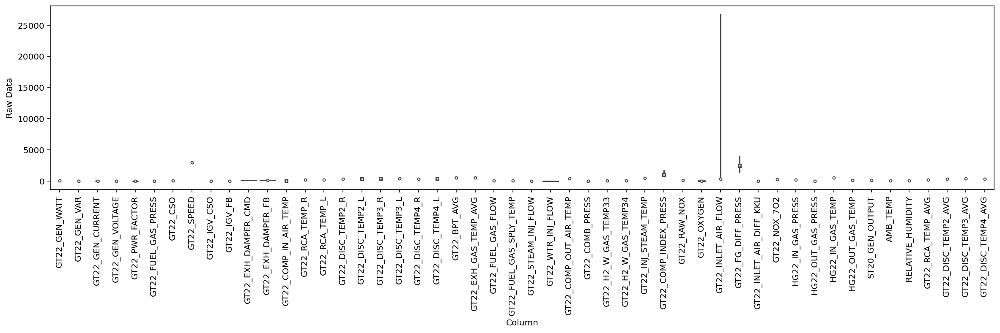

In [9]:
#before normalization 
df_melt = df.melt(var_name='Column', value_name='Raw Data')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Raw Data', data=df_melt)
ax.set_xticklabels(df.keys(), rotation=90);

### Gen. and NOx 

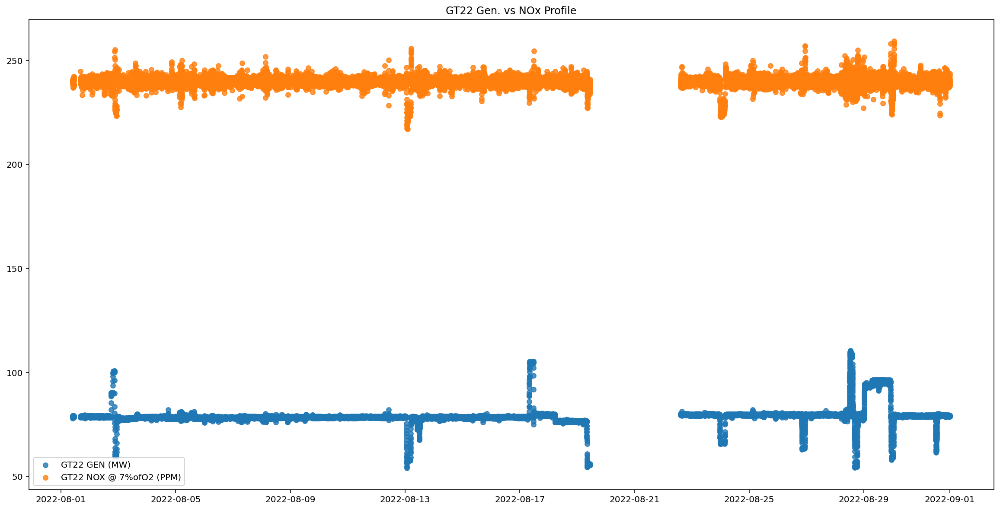

In [10]:
plt.figure(figsize=(20,10))
plt.title('GT22 Gen. vs NOx Profile')
plt.scatter(df.index,df['GT22_GEN_WATT'],s=30,alpha=0.8,label='GT22 GEN (MW)')
plt.scatter(df.index,df['GT22_NOX_7O2'],s=30,alpha=0.8,label='GT22 NOX @ 7%ofO2 (PPM)')
plt.legend()

#plt.figure(figsize=(10,5))
#fig, ax = plt.subplots(2,1,sharex=True)
#ax[0].plot(df['GT22_NOX_7O2'], label='GT22 NOX @ 7%ofO2 (PPM)')
#ax[1].plot(df['GT22_GEN_WATT'], label='GT22 GEN (MW)')

### Correlation BEFORE Feature Selection

<AxesSubplot:title={'center':'Correlation BEFORE Features Selection'}>

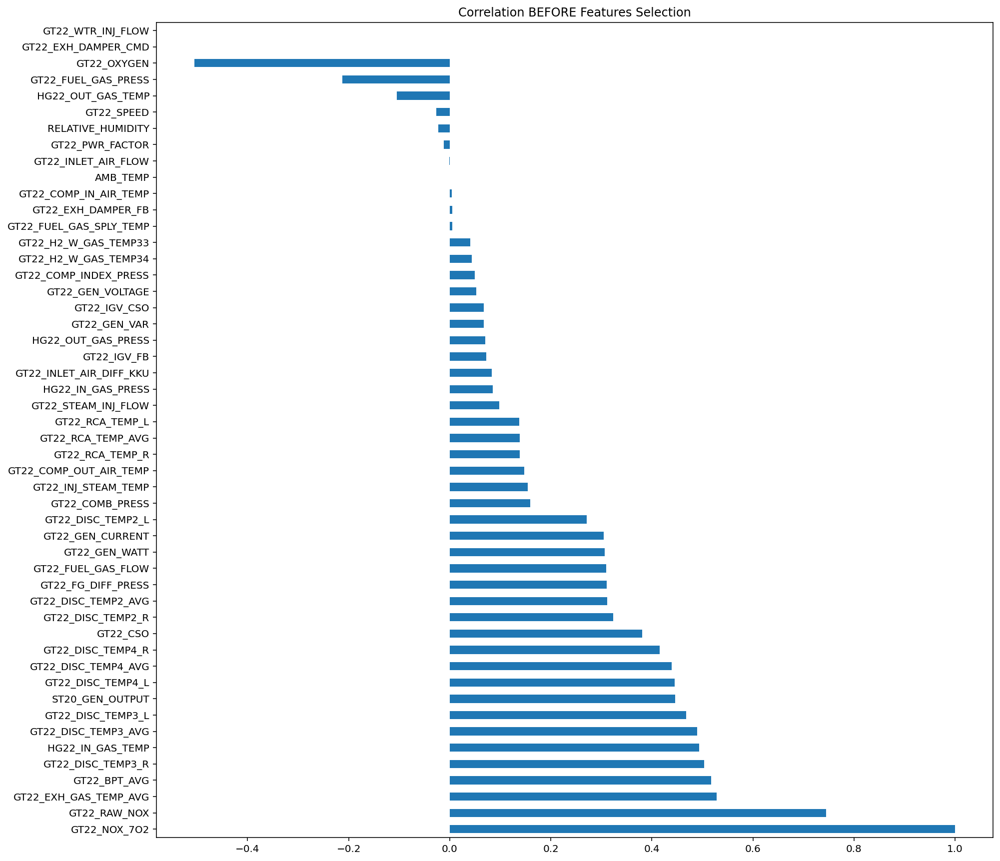

In [11]:
plt.title('Correlation BEFORE Features Selection')
df.corr()['GT22_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))

### Heatamp BEFORE Features Selections

<AxesSubplot:>

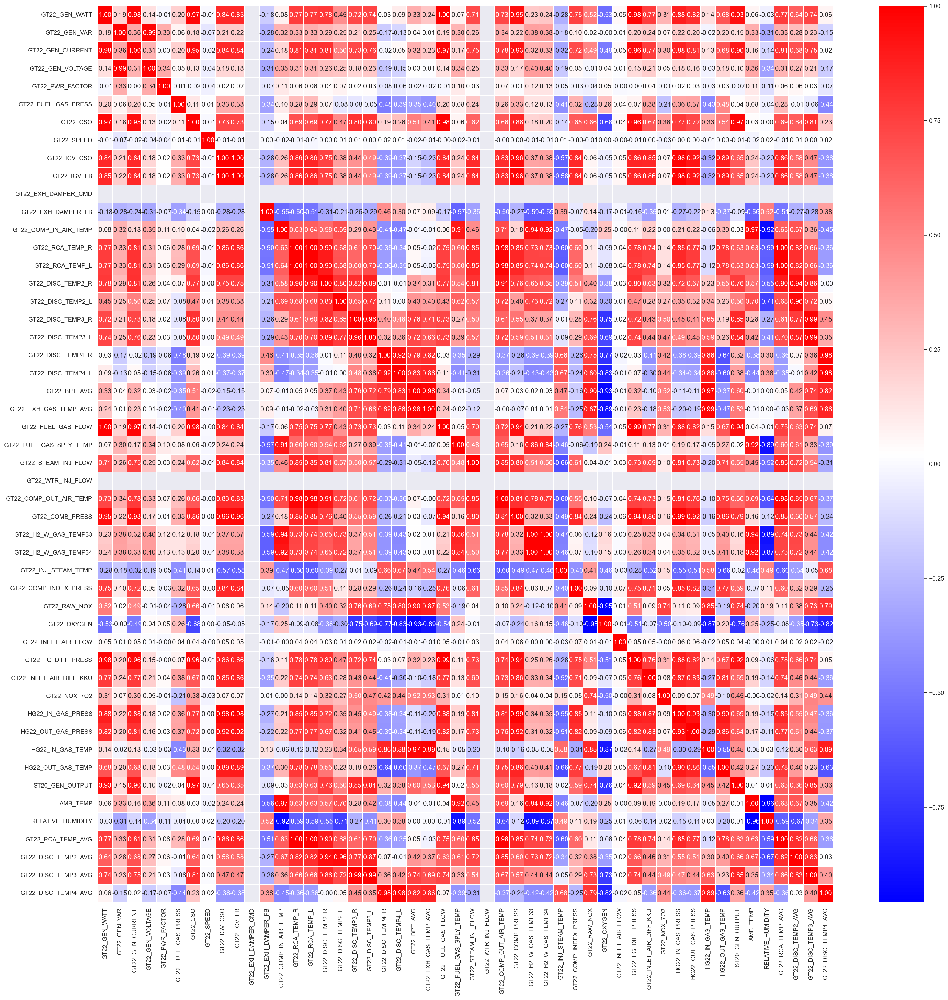

In [12]:
sns.set(rc={'figure.figsize': (30, 30)})
sns.heatmap(df.corr(), cmap ="bwr", annot=True, fmt='.2f', linewidths=0.05)

In [13]:
df.columns

Index(['GT22_GEN_WATT', 'GT22_GEN_VAR', 'GT22_GEN_CURRENT', 'GT22_GEN_VOLTAGE',
       'GT22_PWR_FACTOR', 'GT22_FUEL_GAS_PRESS', 'GT22_CSO', 'GT22_SPEED',
       'GT22_IGV_CSO', 'GT22_IGV_FB', 'GT22_EXH_DAMPER_CMD',
       'GT22_EXH_DAMPER_FB', 'GT22_COMP_IN_AIR_TEMP', 'GT22_RCA_TEMP_R',
       'GT22_RCA_TEMP_L', 'GT22_DISC_TEMP2_R', 'GT22_DISC_TEMP2_L',
       'GT22_DISC_TEMP3_R', 'GT22_DISC_TEMP3_L', 'GT22_DISC_TEMP4_R',
       'GT22_DISC_TEMP4_L', 'GT22_BPT_AVG', 'GT22_EXH_GAS_TEMP_AVG',
       'GT22_FUEL_GAS_FLOW', 'GT22_FUEL_GAS_SPLY_TEMP', 'GT22_STEAM_INJ_FLOW',
       'GT22_WTR_INJ_FLOW', 'GT22_COMP_OUT_AIR_TEMP', 'GT22_COMB_PRESS',
       'GT22_H2_W_GAS_TEMP33', 'GT22_H2_W_GAS_TEMP34', 'GT22_INJ_STEAM_TEMP',
       'GT22_COMP_INDEX_PRESS', 'GT22_RAW_NOX', 'GT22_OXYGEN',
       'GT22_INLET_AIR_FLOW', 'GT22_FG_DIFF_PRESS', 'GT22_INLET_AIR_DIFF_KKU',
       'GT22_NOX_7O2', 'HG22_IN_GAS_PRESS', 'HG22_OUT_GAS_PRESS',
       'HG22_IN_GAS_TEMP', 'HG22_OUT_GAS_TEMP', 'ST20_GEN_OUTPUT',

## Features Selection 
Manual Selection from HeatMap Correlation

In [14]:
#dropcolumns = ['GT22_EXH_DAMPER_CMD','GT22_EXH_DAMPER_FB','GT22_RAW_NOX', 'GT22_GEN_CURRENT', 
#               'GT22_GEN_VOLTAGE','GT22_FG_DIFF_PRESS', 'GT22_RCA_TEMP_R', 'GT22_RCA_TEMP_L',
#               'GT22_DISC_TEMP2_R', 'GT22_DISC_TEMP2_L','GT22_DISC_TEMP3_R', 'GT22_DISC_TEMP3_L',
#               'GT22_DISC_TEMP4_R', 'GT22_DISC_TEMP4_L', 'GT22_OXYGEN', 'GT22_SPEED',
#               'GT22_WTR_INJ_FLOW', 'GT22_IGV_CSO', 'GT22_INLET_AIR_FLOW']
#df.drop(columns=dropcolumns,inplace=True,errors='ignore')

Selected_Features = ['GT22_GEN_WATT', 'GT22_GEN_VAR', 'GT22_PWR_FACTOR','GT22_FUEL_GAS_PRESS',
                     'GT22_CSO', 'GT22_IGV_FB', 'GT22_COMP_IN_AIR_TEMP', 'GT22_BPT_AVG',
                     'GT22_EXH_GAS_TEMP_AVG', 'GT22_FUEL_GAS_FLOW', 'GT22_FUEL_GAS_SPLY_TEMP', 'GT22_STEAM_INJ_FLOW',
                     'GT22_COMP_OUT_AIR_TEMP', 'GT22_COMB_PRESS', 'GT22_H2_W_GAS_TEMP33', 'GT22_H2_W_GAS_TEMP34',
                     'GT22_INJ_STEAM_TEMP', 'GT22_COMP_INDEX_PRESS', 'GT22_INLET_AIR_DIFF_KKU',
                     'HG22_IN_GAS_PRESS', 'HG22_OUT_GAS_PRESS', 'HG22_IN_GAS_TEMP', 'HG22_OUT_GAS_TEMP', 
                     'ST20_GEN_OUTPUT', 'AMB_TEMP', 'RELATIVE_HUMIDITY', 'GT22_NOX_7O2',
                     'GT22_RCA_TEMP_AVG', 'GT22_DISC_TEMP2_AVG', 'GT22_DISC_TEMP3_AVG', 'GT22_DISC_TEMP4_AVG']

### Correlation AFTER Feature Selection

<AxesSubplot:title={'center':'Correlation AFTER Features Selection'}>

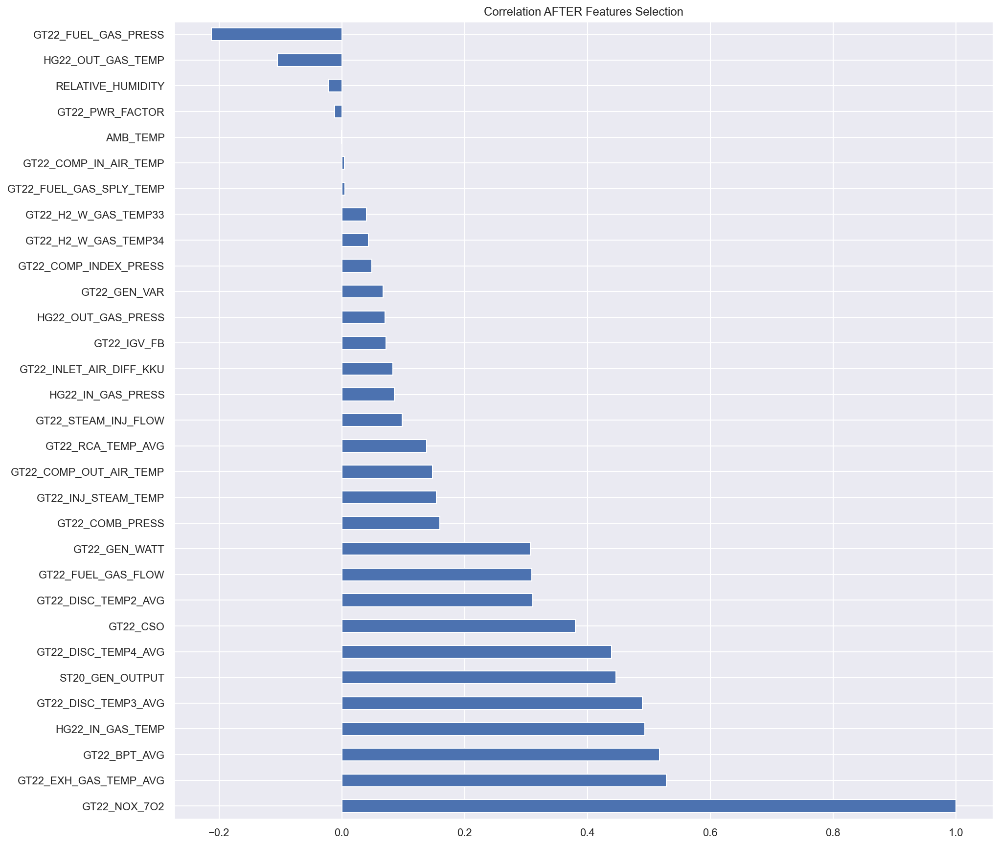

In [15]:
plt.title('Correlation AFTER Features Selection')
df[Selected_Features].corr()['GT22_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))

## Correlation Score

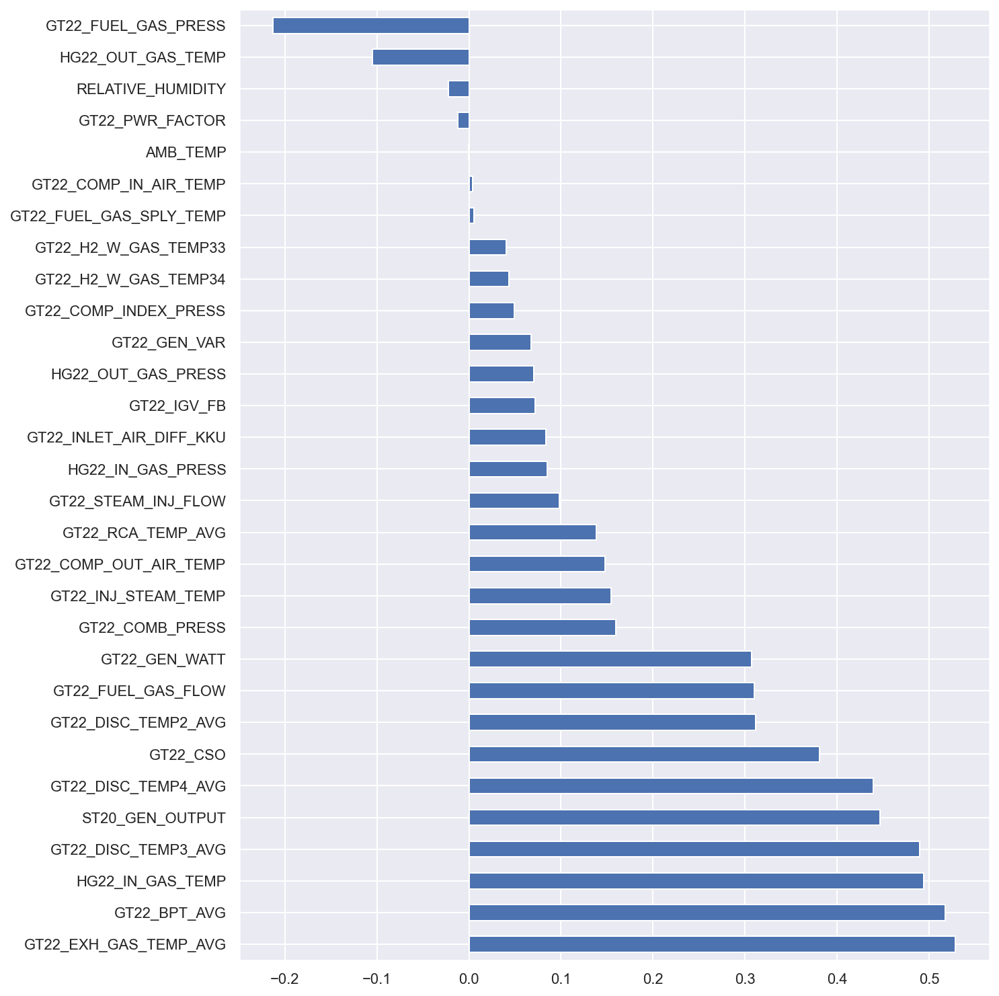

In [16]:
xx = df[Selected_Features].drop('GT22_NOX_7O2', axis=1).apply(lambda x: x.corr(df['GT22_NOX_7O2']))
Result = pd.DataFrame(xx,columns=['Correlation'])
Result['Correlation'].sort_values(ascending=False).plot(kind='barh',figsize=(10,13))
Result = np.abs(Result[['Correlation']])
Result = Result[['Correlation']]*100/Result[['Correlation']].sum()

In [17]:
Result

,Correlation
GT22_GEN_WATT,5.295686
GT22_GEN_VAR,1.166787
GT22_PWR_FACTOR,0.203237
GT22_FUEL_GAS_PRESS,3.669319
GT22_CSO,6.569008
GT22_IGV_FB,1.243738
GT22_COMP_IN_AIR_TEMP,0.071367
GT22_BPT_AVG,8.924836
GT22_EXH_GAS_TEMP_AVG,9.116877
GT22_FUEL_GAS_FLOW,5.343983


# Prediction & Show Feature importance

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import warnings
warnings.filterwarnings('ignore')

In [19]:
#Show Feature Importance and Concat Data
def showandconcat(model_name,importance,Result):
    f_imp = pd.DataFrame(importance, index= train.columns,columns=[model_name])
    f_imp.sort_values(by=[model_name],ascending=False)
    
    f_imp.sort_values(by=[model_name],ascending=True).plot(kind='barh',figsize=(8,9))
    title = 'GT22 Features Important from '+model_name
    plt.title(title)
    
    f_imp_p = np.abs(f_imp)*100/np.abs(f_imp).sum()
    Result = pd.concat([Result,f_imp_p],axis=1)
    Result = Result.loc[:,~Result.columns.duplicated()]
    return Result

In [20]:
#Show Testing and Prediction
def showtestpredict(model_name,y_test_org,y_pred_org):
    
    plt.figure(figsize=(20,10))
    plt.title('GT22 NOx Prediction from ' +model_name)
    plt.scatter(test.index,y_test_org,alpha=0.6,label='test')
    plt.scatter(test.index,y_pred_org,alpha=0.6,label='predict')
    plt.xlabel('Date-Time', fontsize=15)
    plt.ylabel('NOx(ppm)', fontsize=15)
    plt.legend()

In [21]:
#Concat Accurracy DF
def concatacc(model_name,index_name,accuracy_df,accuracy):
    
    print(f'Testing {index_name} = {accuracy:.4f}')
    accuracy_tmp = pd.DataFrame(accuracy,columns=[model_name],index=[index_name])
    accuracy_df = pd.concat([accuracy_df,accuracy_tmp],axis=1).drop_duplicates()
    accuracy_df = accuracy_df.loc[:,~accuracy_df.columns.duplicated()]

    return accuracy_df

## Data Standardization (Normalization)
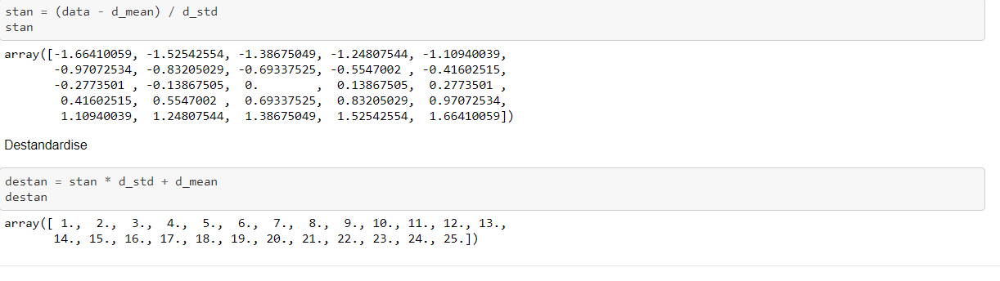

In [22]:
#Prepare Train/Test Data 70:30

train_org, test_org, y_train_org, y_test_org = train_test_split(df[Selected_Features].drop('GT22_NOX_7O2', axis=1), df['GT22_NOX_7O2'], test_size=0.30, random_state=1)

# Standardization
tr_mean = train_org.mean()
tr_std = train_org.std()

train = (train_org - tr_mean)/tr_std
test = (test_org - tr_mean)/tr_std  #use training mean and std


y_train_mean = y_train_org.mean()
y_train_std = y_train_org.std()  

y_train = (y_train_org-y_train_mean)/y_train_std
y_test = (y_test_org-y_train_mean)/y_train_std  #use training mean and std

In [23]:
#Monitor Train Test Ratio
print(f'train shape = {train.shape}')
print(f'test shape = {test.shape}')
print(f'y_train shape = {y_train.shape}')
print(f'y_test shape = {y_test.shape}')

train shape = (27065, 30)
test shape = (11600, 30)
y_train shape = (27065,)
y_test shape = (11600,)


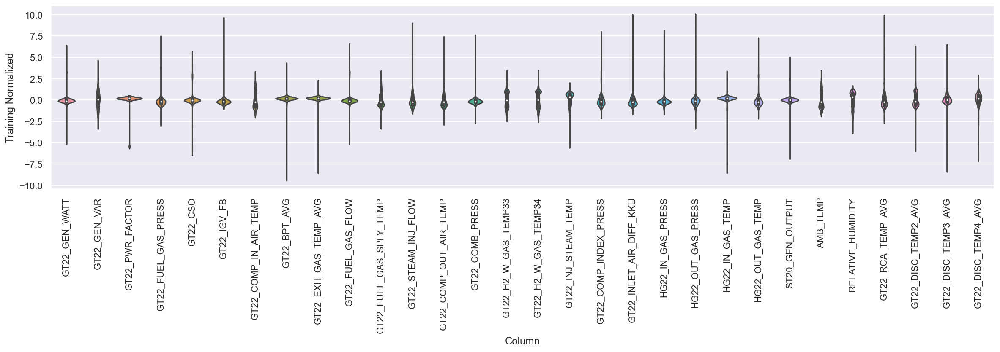

In [24]:
#Training Data after Standardization
df_std_melt = train.melt(var_name='Column', value_name='Training Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Training Normalized', data=df_std_melt)
ax.set_xticklabels(train.keys(), rotation=90);

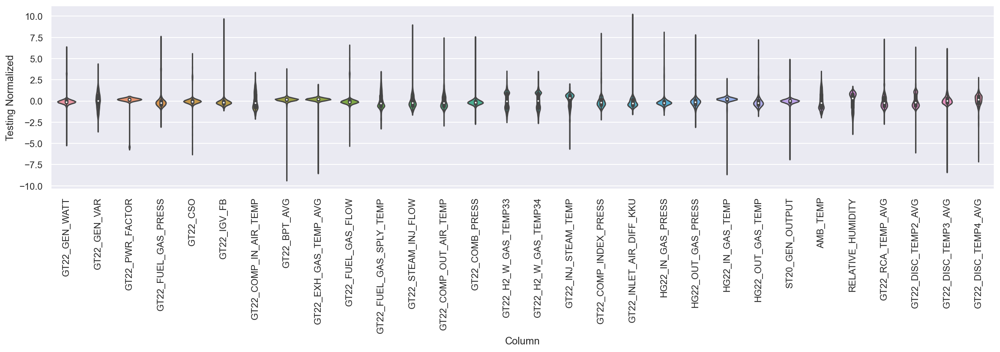

In [25]:
#Testing Data after Standardization
df_std_melt = test.melt(var_name='Column', value_name='Testing Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Testing Normalized', data=df_std_melt)
ax.set_xticklabels(test.keys(), rotation=90);

## Linear Regression 

In [26]:
# ************* Create Initial Empty DF **********
empty_list = [] 
accuracy_mae = pd.DataFrame(empty_list)
accuracy_mape = pd.DataFrame(empty_list)
accuracy_mse = pd.DataFrame(empty_list)

### Prediction and Error Metric

Testing MAE(ppm) = 1.1685
Testing MAPE(%) = 0.4881
Testing MSE = 3.0384


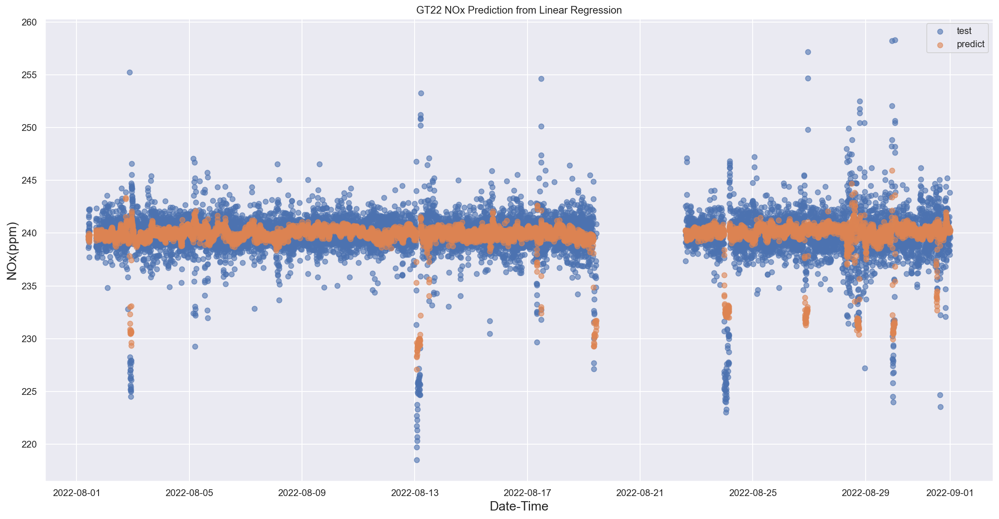

In [27]:
from sklearn.linear_model import LinearRegression

#Modeling
model = LinearRegression()
model.fit(train, y_train)

importance = model.coef_
importance

#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (------------DEBUG ONLY------------)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_LinearReg.xlsx')

#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('Linear Regression','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('Linear Regression','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('Linear Regression','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('Linear Regression',y_test_org,y_pred_org)

### Feature Importance

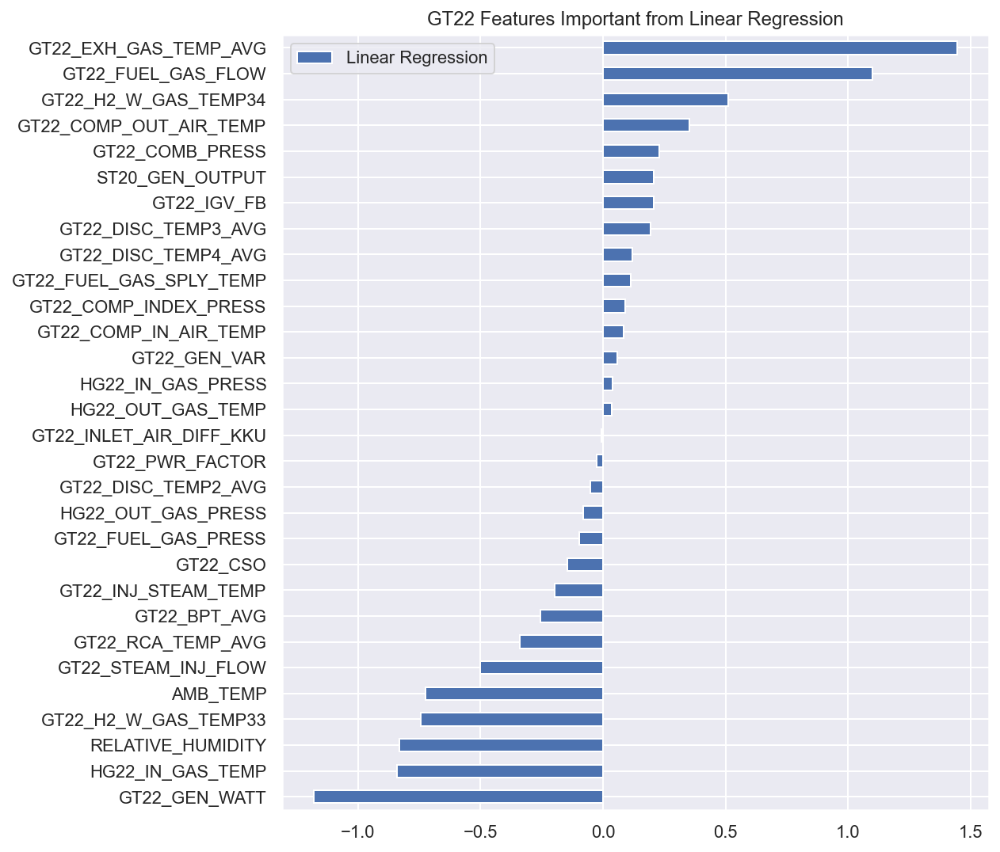

In [28]:
#Feature Importance
Result = showandconcat('Linear Regression',importance,Result)


## Decision Tree

### Prediction and Error Metric

Testing MAE(ppm) = 1.0855
Testing MAPE(%) = 0.4529
Testing MSE = 2.6472


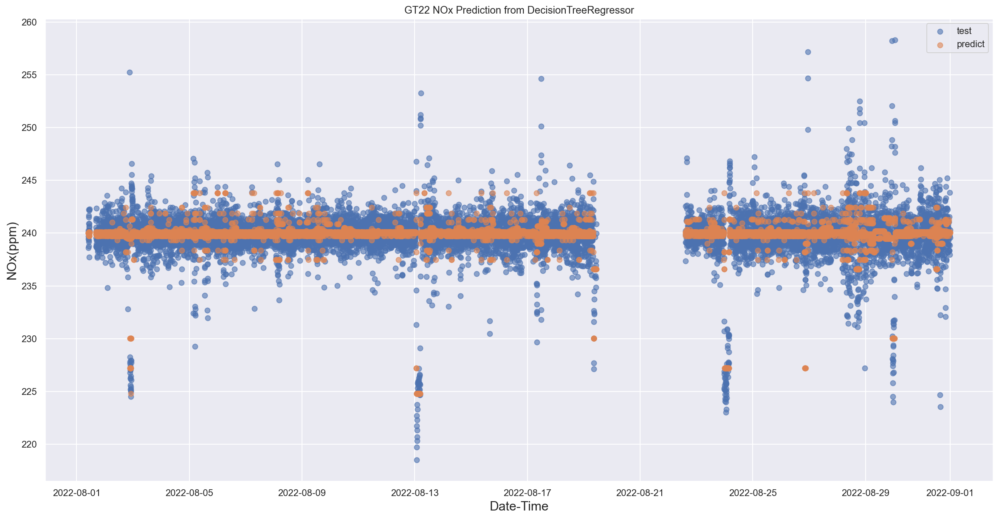

In [29]:
from sklearn.tree import DecisionTreeRegressor

#Modeling
model = DecisionTreeRegressor(criterion='mse',max_depth=8,max_leaf_nodes=100,min_samples_leaf=100,min_samples_split=10)
model.fit(train, y_train)
importance = model.feature_importances_

#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (for DEBUG ONLY)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_DecisionTree.xlsx')

#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('DecisionTreeRegressor','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('DecisionTreeRegressor','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('DecisionTreeRegressor','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('DecisionTreeRegressor',y_test_org,y_pred_org)


### Feature Importance

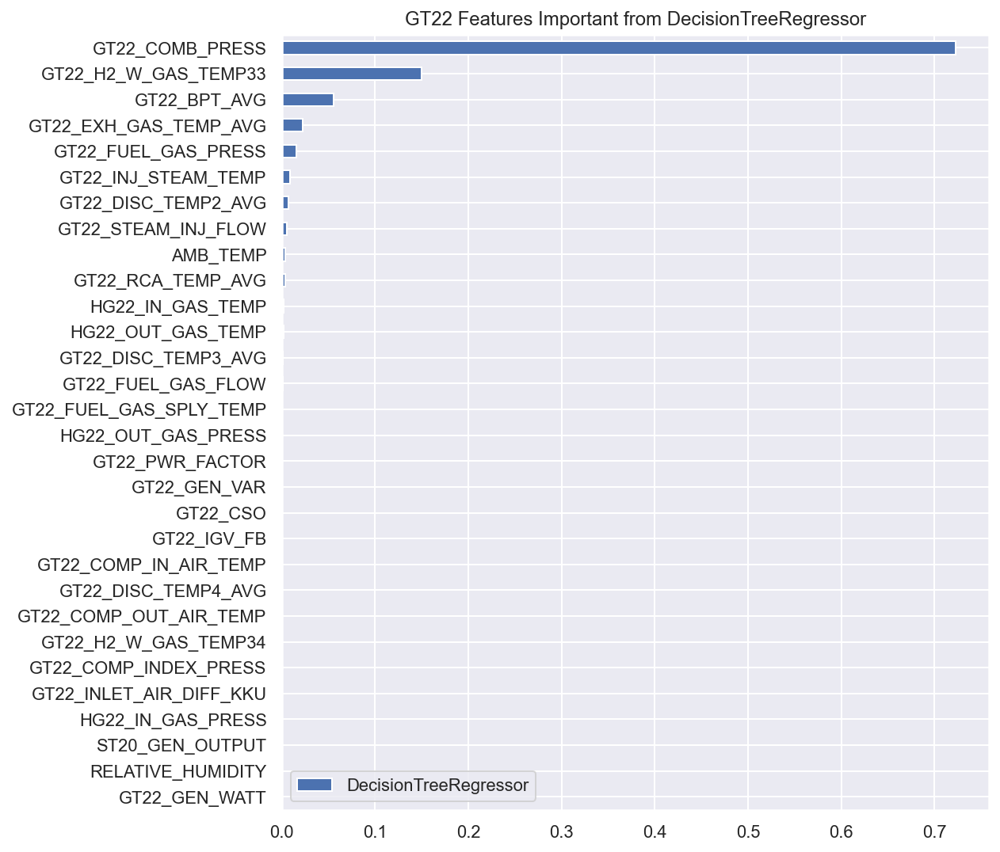

In [30]:
#Feature Importance
Result = showandconcat('DecisionTreeRegressor',importance,Result)


## Random Forest

### Prediction and Error Metric

Testing MAE(ppm) = 0.9705
Testing MAPE(%) = 0.4047
Testing MSE = 1.8904


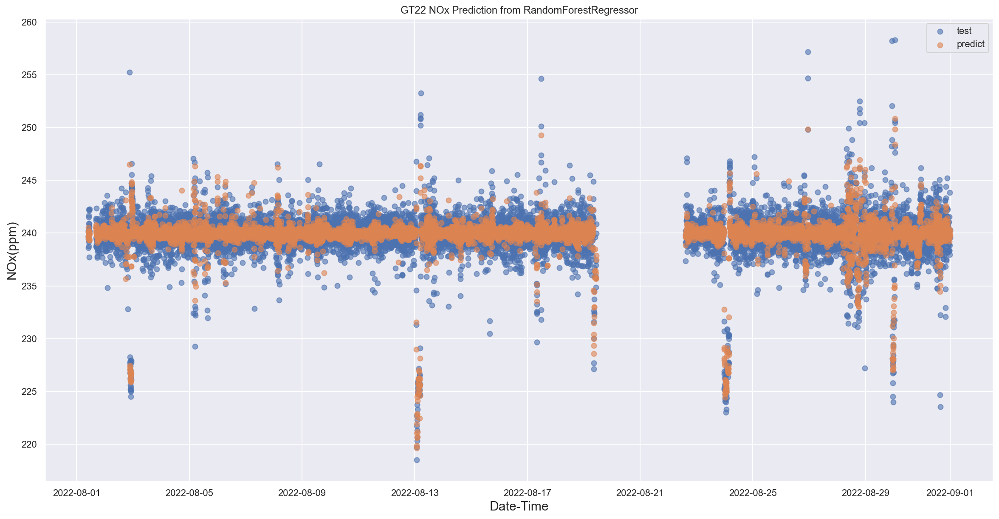

In [31]:
from sklearn.ensemble import RandomForestRegressor

#Modeling
model = RandomForestRegressor()
model.fit(train, y_train)
importance = model.feature_importances_

#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (for DEBUG ONLY)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_RandomForest.xlsx')


#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('RandomForestRegressor','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('RandomForestRegressor','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('RandomForestRegressor','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('RandomForestRegressor',y_test_org,y_pred_org)


### Feature Importance

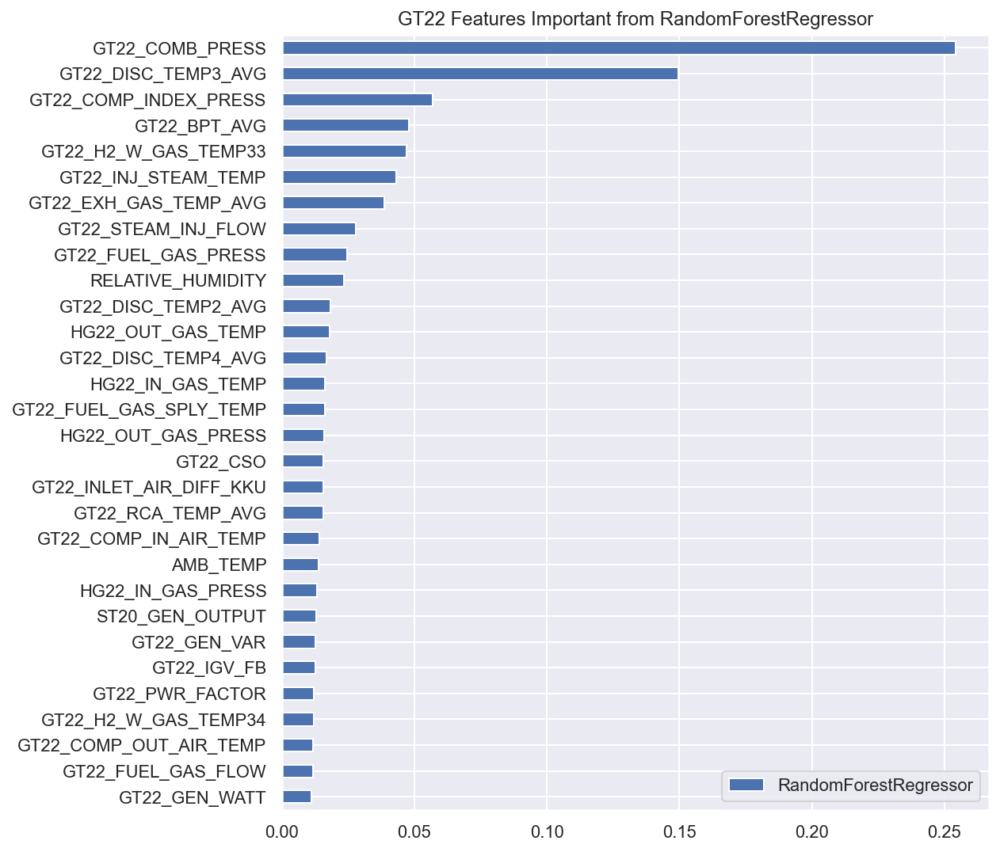

In [32]:
#Feature Importance
Result = showandconcat('RandomForestRegressor',importance,Result)


## XGBoost Regression

### Prediction and Error Metric

Testing MAE(ppm) = 0.9701
Testing MAPE(%) = 0.4046
Testing MSE = 1.8011


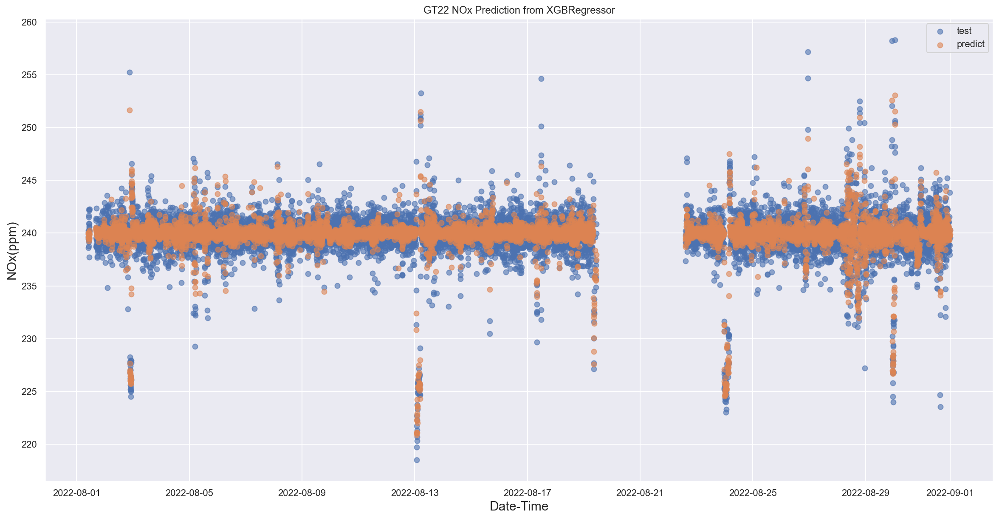

In [33]:
from xgboost import XGBRegressor

#Modeling
model = XGBRegressor()
model.fit(train, y_train)
importance = model.feature_importances_

#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (for DEBUG ONLY)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_XGBRegress.xlsx')

#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('XGBRegressor','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('XGBRegressor','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('XGBRegressor','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('XGBRegressor',y_test_org,y_pred_org)


###  Feature Importance

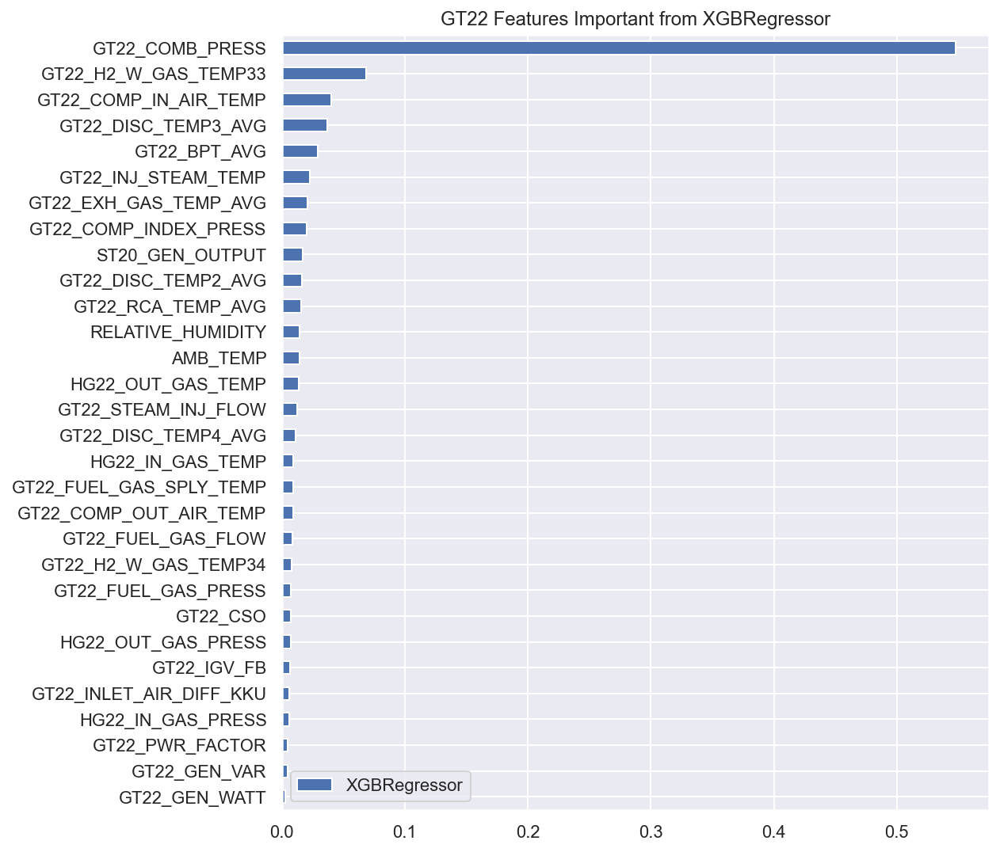

In [34]:
#Feature Importance
Result = showandconcat('XGBRegressor',importance,Result)


## K-NN Regression

### Prediction and Error Metric

Testing MAE(ppm) = 1.0295
Testing MAPE(%) = 0.4293
Testing MSE = 2.2017


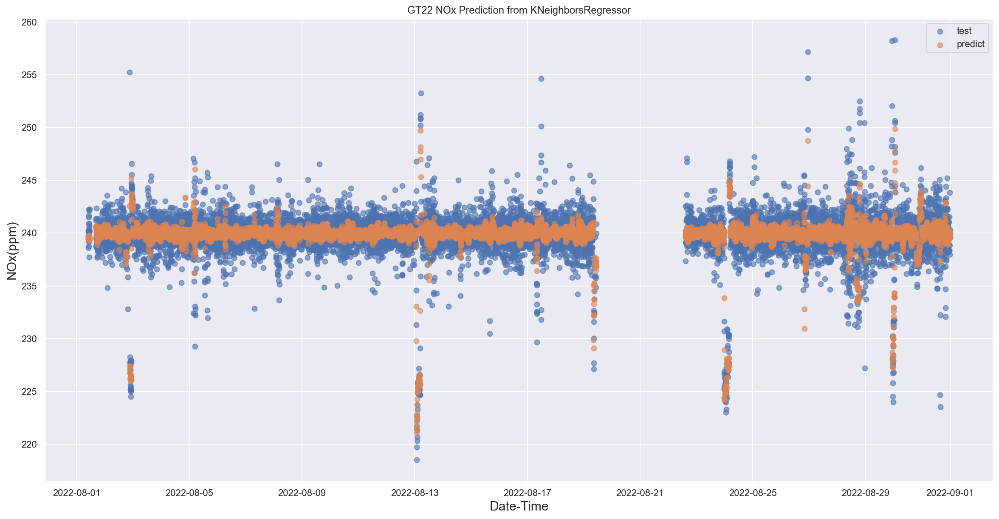

In [35]:
from sklearn.neighbors import KNeighborsRegressor

#Modeling
model = KNeighborsRegressor(n_neighbors= 19)
model.fit(train, y_train)

#Feature Importance Calculation
results = permutation_importance(model, train, y_train, scoring='neg_mean_squared_error')
importance = results.importances_mean

#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (for DEBUG ONLY)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_KNN.xlsx')

#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('KNeighborsRegressor','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('KNeighborsRegressor','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('KNeighborsRegressor','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('KNeighborsRegressor',y_test_org,y_pred_org)


### Feature Importance

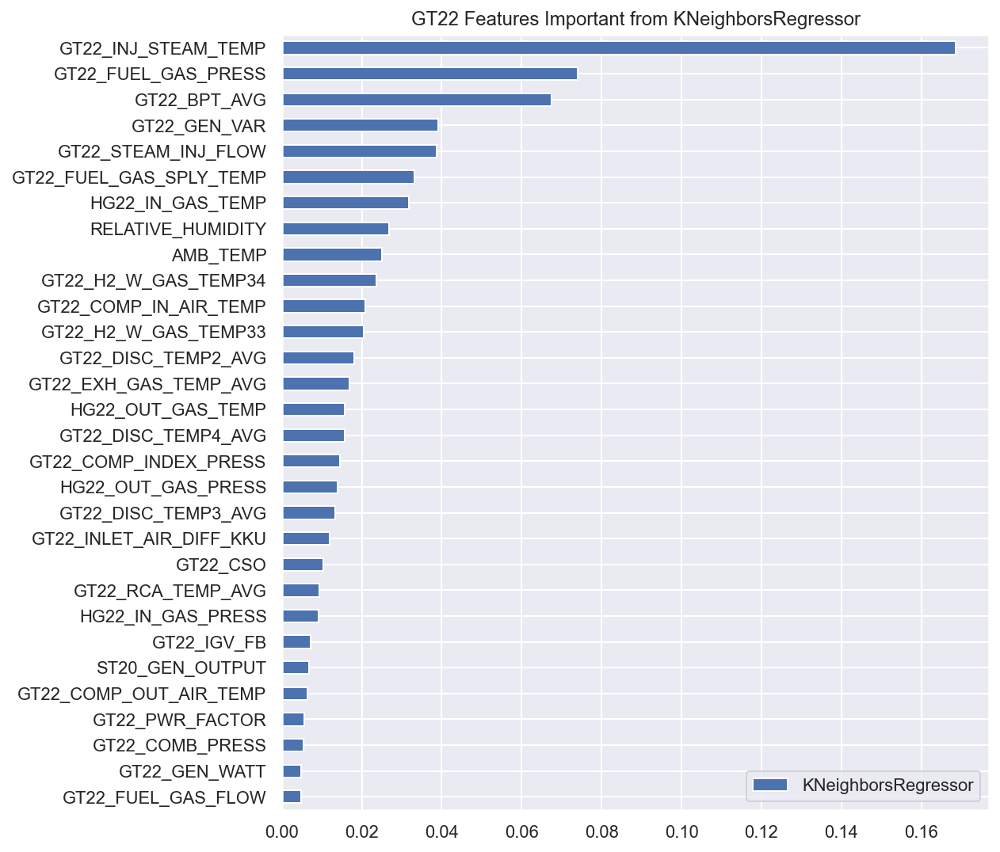

In [36]:
#Feature Importance
Result = showandconcat('KNeighborsRegressor',importance,Result)


## Neural Network (Regression)

### Modeling

In [37]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=128, activation='relu', input_shape=(len(Selected_Features)-1,)),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1)
#     tf.keras.layers.Dense(units=len(outputs), activation='softmax'),
])

# For Regression
model.compile(loss='mean_absolute_error', optimizer=tf.optimizers.Adam(), metrics=['mean_absolute_error'])

train_np = np.array(train).reshape(-1,len(Selected_Features)-1)
y_train_np = np.array(y_train)

#Modeling
model.fit(train_np,y_train_np,epochs=100,verbose=2)


Epoch 1/100
846/846 - 2s - loss: 0.5132 - mean_absolute_error: 0.5132 - 2s/epoch - 3ms/step
Epoch 2/100
846/846 - 1s - loss: 0.4860 - mean_absolute_error: 0.4860 - 1s/epoch - 2ms/step
Epoch 3/100
846/846 - 1s - loss: 0.4738 - mean_absolute_error: 0.4738 - 1s/epoch - 1ms/step
Epoch 4/100
846/846 - 1s - loss: 0.4659 - mean_absolute_error: 0.4659 - 1s/epoch - 1ms/step
Epoch 5/100
846/846 - 2s - loss: 0.4579 - mean_absolute_error: 0.4579 - 2s/epoch - 2ms/step
Epoch 6/100
846/846 - 2s - loss: 0.4528 - mean_absolute_error: 0.4528 - 2s/epoch - 2ms/step
Epoch 7/100
846/846 - 1s - loss: 0.4469 - mean_absolute_error: 0.4469 - 1s/epoch - 2ms/step
Epoch 8/100
846/846 - 1s - loss: 0.4447 - mean_absolute_error: 0.4447 - 1s/epoch - 2ms/step
Epoch 9/100
846/846 - 1s - loss: 0.4402 - mean_absolute_error: 0.4402 - 1s/epoch - 2ms/step
Epoch 10/100
846/846 - 1s - loss: 0.4384 - mean_absolute_error: 0.4384 - 1s/epoch - 2ms/step
Epoch 11/100
846/846 - 1s - loss: 0.4353 - mean_absolute_error: 0.4353 - 1s/epo

Epoch 90/100
846/846 - 1s - loss: 0.3392 - mean_absolute_error: 0.3392 - 1s/epoch - 1ms/step
Epoch 91/100
846/846 - 1s - loss: 0.3381 - mean_absolute_error: 0.3381 - 1s/epoch - 1ms/step
Epoch 92/100
846/846 - 1s - loss: 0.3368 - mean_absolute_error: 0.3368 - 1s/epoch - 1ms/step
Epoch 93/100
846/846 - 1s - loss: 0.3376 - mean_absolute_error: 0.3376 - 1s/epoch - 1ms/step
Epoch 94/100
846/846 - 1s - loss: 0.3350 - mean_absolute_error: 0.3350 - 1s/epoch - 1ms/step
Epoch 95/100
846/846 - 1s - loss: 0.3340 - mean_absolute_error: 0.3340 - 1s/epoch - 1ms/step
Epoch 96/100
846/846 - 1s - loss: 0.3345 - mean_absolute_error: 0.3345 - 1s/epoch - 1ms/step
Epoch 97/100
846/846 - 1s - loss: 0.3328 - mean_absolute_error: 0.3328 - 1s/epoch - 1ms/step
Epoch 98/100
846/846 - 1s - loss: 0.3327 - mean_absolute_error: 0.3327 - 1s/epoch - 1ms/step
Epoch 99/100
846/846 - 1s - loss: 0.3319 - mean_absolute_error: 0.3319 - 1s/epoch - 1ms/step
Epoch 100/100
846/846 - 1s - loss: 0.3305 - mean_absolute_error: 0.330

### Prediction

363/363 [==============================] - 1s 1ms/step
Testing MAE(ppm) = 0.9789
Testing MAPE(%) = 0.4083
Testing MSE = 1.7764


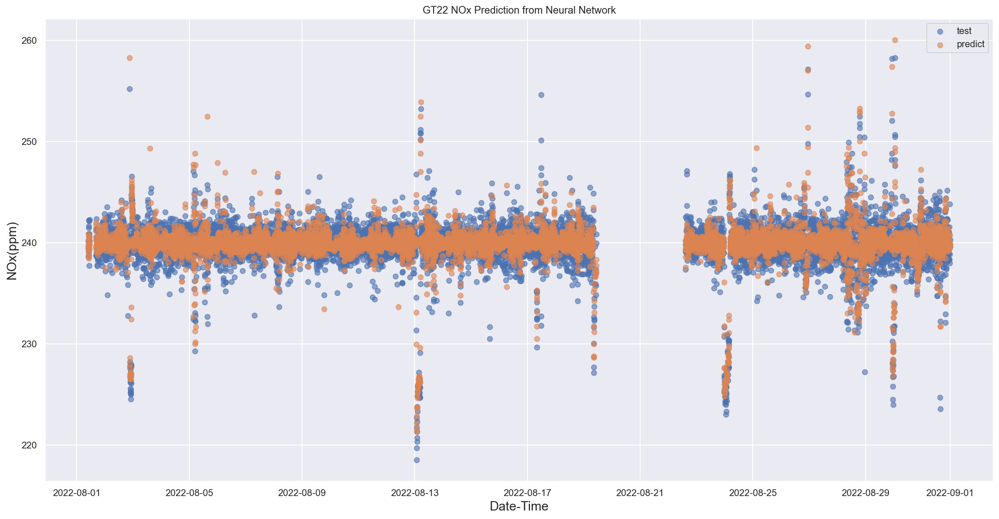

In [38]:
#Prediction
y_pred = model.predict(test)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

#Export to Excel (for DEBUG ONLY)
test_pred = pd.concat([y_test_org,y_pred_org],axis=1)
test_pred.to_excel('GT22compare_NN.xlsx')

#Show and Concat Error Metric
mae = mean_absolute_error(y_test_org,y_pred_org)
accuracy_mae = concatacc('Neural Network','MAE(ppm)',accuracy_mae,mae)
    
mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
accuracy_mape = concatacc('Neural Network','MAPE(%)',accuracy_mape,mape)

mse = mean_squared_error(y_test_org,y_pred_org)
accuracy_mse = concatacc('Neural Network','MSE',accuracy_mse,mse)

#Show Prediction Graph
showtestpredict('Neural Network',y_test_org,y_pred_org)


### Feature Importance

846/846 [==============================] - 1s 881us/step


846/846 [==============================] - 1s 992us/step


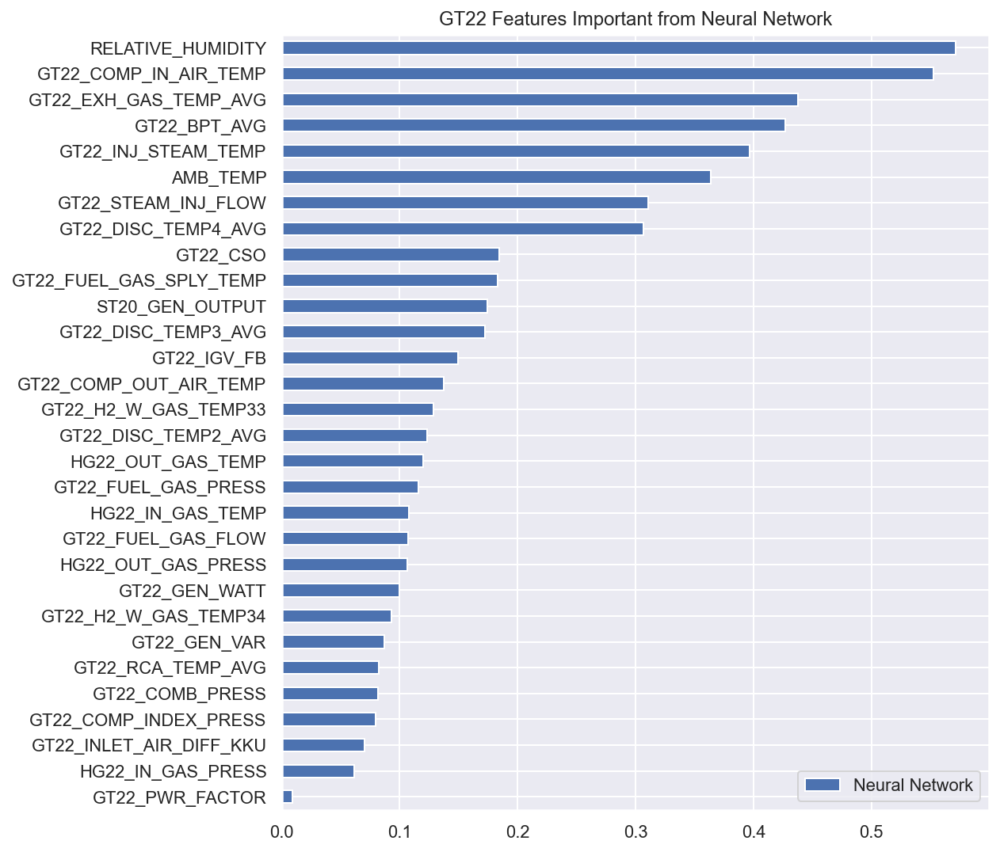

In [39]:
#Permutation Feature Importance
results = permutation_importance(model, train, y_train, scoring='neg_mean_absolute_error')
importance = results.importances_mean

#Feature Importance
Result = showandconcat('Neural Network',importance,Result)


# Show The Result

## Shown Accuracy

In [41]:
accuracy = pd.concat([accuracy_mae,accuracy_mape,accuracy_mse])
accuracy

,Linear Regression,DecisionTreeRegressor,RandomForestRegressor,XGBRegressor,KNeighborsRegressor,Neural Network
MAE(ppm),1.168525,1.085470,0.970482,0.970140,1.029495,0.978942
MAPE(%),0.488054,0.452853,0.404658,0.404569,0.429297,0.408311
MSE,3.038390,2.647164,1.890410,1.801102,2.201747,1.776361


In [42]:
Result.sum()

Correlation              100.0
Linear Regression        100.0
DecisionTreeRegressor    100.0
RandomForestRegressor    100.0
XGBRegressor             100.0
KNeighborsRegressor      100.0
Neural Network           100.0
dtype: float64

## Export Accuracy and Feature Importance

In [43]:
accuracy.to_excel('GT22_Aug22_Accuracy_Result.xlsx')
Result.to_excel('GT22_Aug22_Feature_Importance.xlsx')

## Feature Importance average from all Models

<AxesSubplot:>

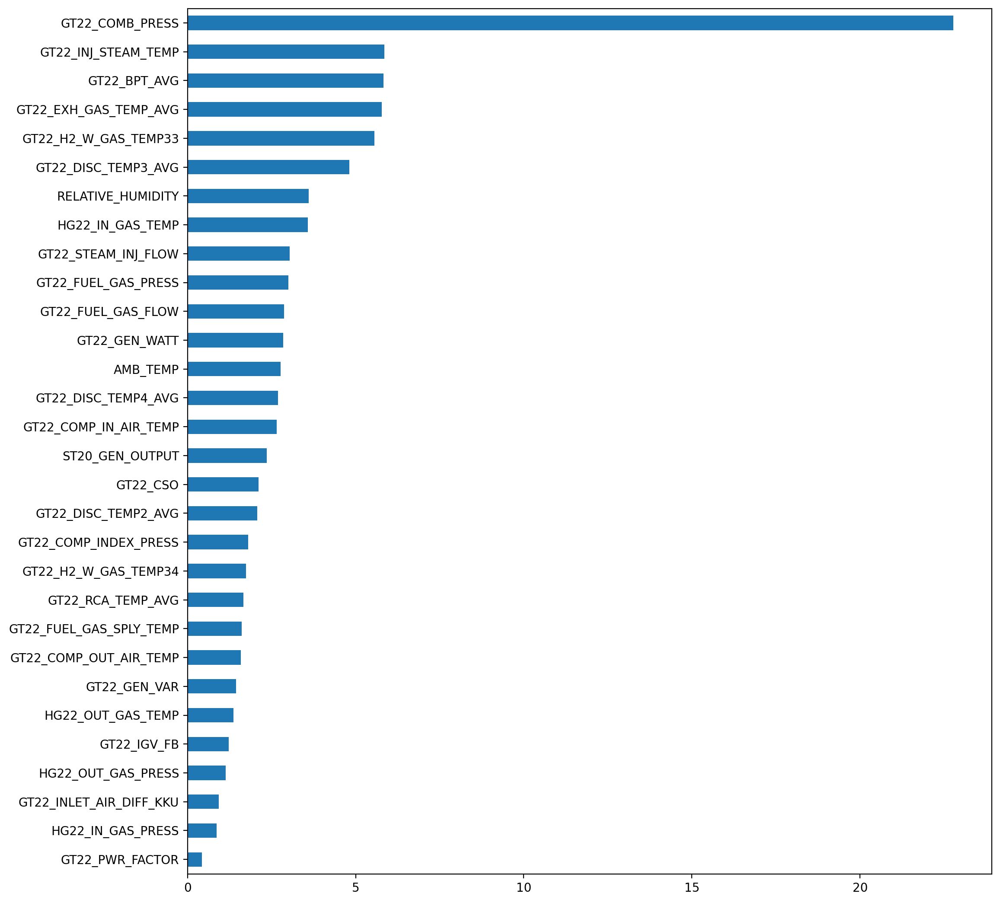

In [44]:
Result['Mean'] = Result.mean(axis=1)
Result['Sum'] = Result.sum(axis=1)-Result['Mean'] #Excluse Mean Column

plt.style.use('default')
Result['Mean'].sort_values().plot(kind='barh',figsize=(12,13))

In [53]:
#Result
Result.sort_values(by=['Mean'],ascending=False)

,Correlation,Linear Regression,DecisionTreeRegressor,RandomForestRegressor,XGBRegressor,KNeighborsRegressor,Neural Network,Mean,Sum
GT22_COMB_PRESS,2.753988,2.121136,72.251034,25.419218,54.780048,0.714889,1.393660,22.776282,159.433974
GT22_INJ_STEAM_TEMP,2.663575,1.812777,0.878694,4.325340,2.294866,22.184397,6.796232,5.850840,40.955881
GT22_BPT_AVG,8.924836,2.364956,5.570094,4.780254,2.932899,8.884851,7.312875,5.824395,40.770765
GT22_EXH_GAS_TEMP_AVG,9.116877,13.380208,2.216593,3.860552,2.095212,2.238340,7.489667,5.771064,40.397451
GT22_H2_W_GAS_TEMP33,0.697163,6.878769,14.956842,4.692083,6.827694,2.696486,2.202977,5.564573,38.952014
GT22_DISC_TEMP3_AVG,8.449979,1.803796,0.109350,14.952449,3.691368,1.768291,2.944216,4.817064,33.719450
RELATIVE_HUMIDITY,0.384712,7.685966,0.000000,2.341276,1.468942,3.531648,9.782387,3.599276,25.194931
HG22_IN_GAS_TEMP,8.519759,7.773322,0.181680,1.631130,0.940761,4.188158,1.844960,3.582824,25.079770
GT22_STEAM_INJ_FLOW,1.700099,4.627422,0.507838,2.776180,1.256716,5.087992,5.317631,3.039125,21.273877
GT22_FUEL_GAS_PRESS,3.669319,0.884880,1.542229,2.474575,0.752472,9.728407,1.983878,3.005108,21.035759


## Feature Importance on Box Plot

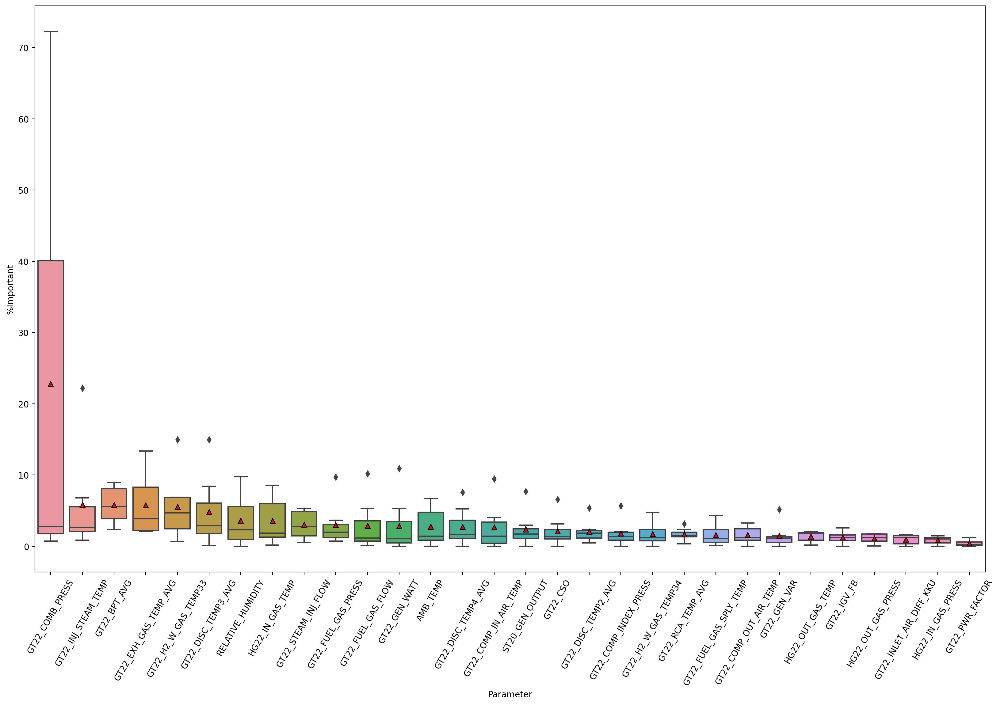

In [46]:
#plt.style.available

Result_T = Result.sort_values(by=['Mean'],ascending=False).drop(columns=['Sum','Mean']).transpose()
# Result_T.plot.hist(bins=60,figsize=(15,6),alpha=0.3)

#before normalization 
Result_T_melt = Result_T.melt(var_name='Parameter', value_name='%Important')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 12))
ax = sns.boxplot(x='Parameter', y='%Important', data=Result_T_melt,showmeans=True,meanprops={
                       "markerfacecolor":"red", 
                       "markeredgecolor":"black",
                      "markersize":"6"})
ax.set_xticklabels(Result_T.keys(), rotation=60);

## Report All Features 

In [47]:
Des = Result.drop(columns=['Sum','Mean']).transpose().describe()
Des

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_IGV_FB,GT22_COMP_IN_AIR_TEMP,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_INLET_AIR_DIFF_KKU,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,2.849775,1.442754,0.434240,3.005108,2.109165,1.226545,2.646367,5.824395,5.771064,2.869092,1.605296,3.039125,1.586612,22.776282,5.564573,1.736447,5.850840,1.807522,0.927675,0.859011,1.136743,3.582824,1.369607,2.360303,2.773974,3.599276,1.662481,2.074652,4.817064,2.691185
std,3.981232,1.713278,0.418588,3.127247,2.186304,0.833578,3.342777,2.667023,4.365079,3.658306,1.600941,1.973096,1.156496,29.581599,4.752481,1.641626,7.459198,1.843545,0.690045,0.546709,0.662832,3.358511,0.804056,2.530755,2.740619,3.749346,0.887515,1.612090,5.183889,2.706663
min,0.000000,0.000000,0.000000,0.752472,0.000000,0.000000,0.000000,2.364956,2.095212,0.099570,0.070182,0.507838,0.000000,0.714889,0.697163,0.000000,0.878694,0.000000,0.000000,0.000000,0.062944,0.181680,0.159479,0.000000,0.003520,0.000000,0.327794,0.471924,0.109350,0.000000
25%,0.455962,0.511053,0.180570,1.213554,1.046575,0.800144,0.423860,3.856576,2.227467,0.733507,0.498331,1.478408,0.874401,1.757398,2.449732,0.756099,2.053822,0.842035,0.349685,0.484505,0.725642,1.285946,0.852698,1.095664,0.866285,0.926827,1.319148,1.182638,1.786044,1.126058
50%,1.111955,1.166787,0.231700,1.983878,1.378707,1.243738,1.426104,5.570094,3.860552,1.162104,1.058307,2.776180,1.189999,2.753988,4.692083,1.195343,2.663575,1.360970,1.205555,1.053581,1.216738,1.844960,1.792921,1.711224,1.438900,2.341276,1.557993,1.828795,2.944216,1.697785
75%,3.501834,1.383972,0.620278,3.071947,2.361646,1.590677,3.393999,8.098863,8.303272,3.589893,2.373398,4.857707,2.450512,40.099633,6.853231,2.352440,5.560786,1.963078,1.507041,1.259615,1.699904,5.980740,1.932778,2.456674,4.762389,5.608807,1.991810,2.242878,6.070674,3.654232
max,10.920879,5.142438,1.206282,9.728407,6.569008,2.560435,9.462744,8.924836,13.380208,10.175169,4.365130,5.317631,3.266461,72.251034,14.956842,4.742709,22.184397,5.681454,1.574720,1.471258,1.826428,8.519759,2.063896,7.706219,6.718050,9.782387,3.129665,5.370817,14.952449,7.579927


In [48]:
# Export to Excel
Result[['Mean']].sort_values(['Mean'],ascending=False).to_excel('GT22_Feat_Result.xlsx')

In [49]:
#Visualize top 5 on Pairplot
#top5_features = ['GT22_DISC_TEMP2_AVG','GT22_STEAM_INJ_FLOW','GT22_INJ_STEAM_TEMP',
#                 'GT22_COMB_PRESS','RELATIVE_HUMIDITY','GT22_NOX_7O2']
#sns.pairplot(df[top5_features])